In [1]:
import sys
sys.path.append("../")

In [2]:
import graspologic as gr
from graspologic import layouts
import numpy as np
import pandas as pd
import networkx as nx
from graph import GraphIO

Load the connectome to visualize

In [3]:
path = '../json_connectomes/ciona.json'
graph, _, _, _ = GraphIO.load(path)

Lets try a graspologic layout

In [11]:
graph = graph.to_undirected()
graph, layout = gr.layouts.layout_tsne(graph, perplexity=20, n_iter=1000000)

In [7]:
color_map = {}
side_map = {'L': '#FF0000', 'DL': '#B22222', 'VL': '#F08080',
            'R': '#0000FF', 'DR': '#00008B', 'VR': '#87CEEB',
            'DM': '#800080', 'D': '#800080', 'VM': '#BA55D3',
            None: '#A9A9A9'}

for node in graph.nodes(data=True):
    try:
        side = node[1]['Side'].strip()
    except KeyError:
        side = None
    color_map[node[0]] = side_map[side]

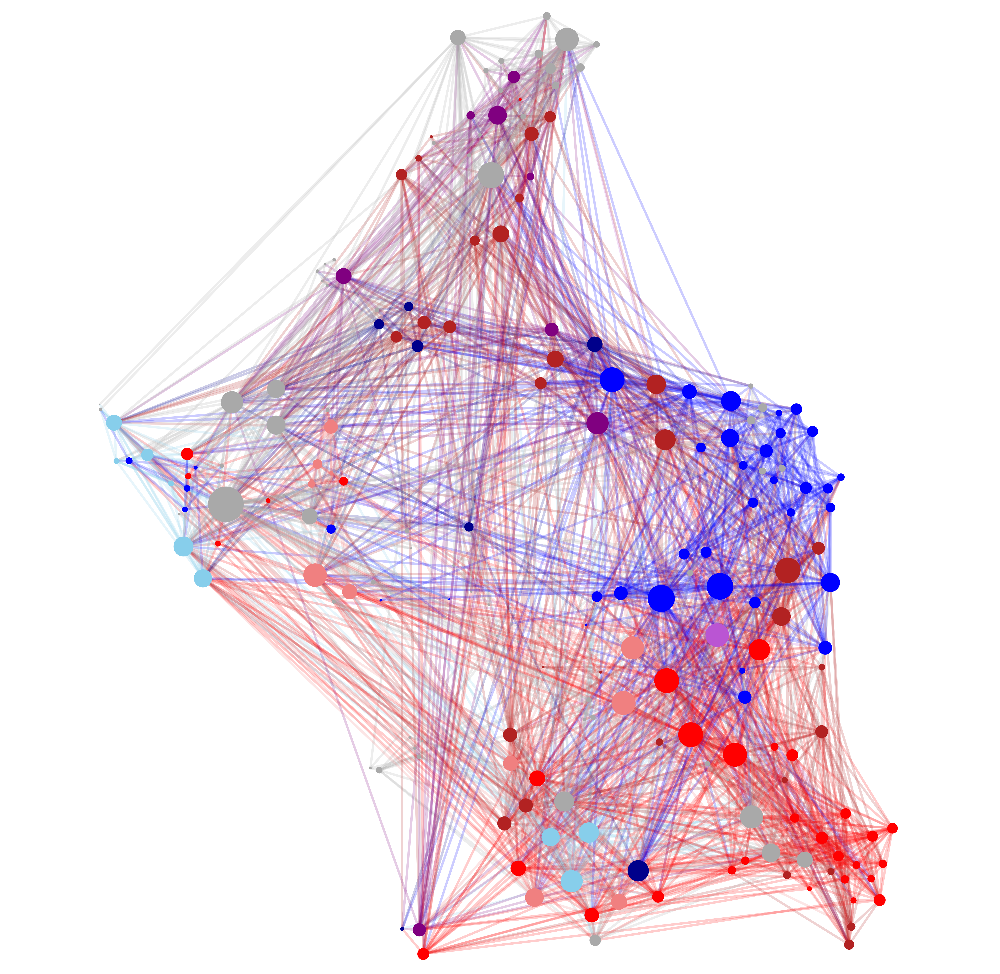

In [12]:
gr.layouts.show_graph(graph, layout, color_map, vertex_shape='.', vertex_alpha=1., edge_alpha=.2, edge_line_width=2.)

This seems to work ok, here the colors are based on side.

Get basic stats


In [13]:
import pandas as pd
num_nodes = len(graph.nodes)
num_edges = len(graph.edges)
density = num_edges / (num_nodes * (num_nodes - 1))
max_degree = max(graph.degree, key=lambda x: x[1])[1]
data = {'Number of Nodes': [num_nodes],
        'Number of Edges': [num_edges],
        'Density': [density],
        'Max Degree': [max_degree]}
df = pd.DataFrame.from_dict(data)
df.index = ['Ciona Intestinalis Connectome']
df.head()

,Number of Nodes,Number of Edges,Density,Max Degree
Ciona Intestinalis Connectome,222,2289,0.046655,78


In [48]:
adj, node_atts, edge_atts = GraphIO.get_adjacency_representation(graph)
adj = adj / adj.mean()
adj[adj > .1] = 1
adj[adj <= .1] = 0

In [49]:
from itertools import chain, combinations

def powerset(iterable, ignore_empty=True):
    # REF: https://stackoverflow.com/questions/1482308/how-to-get-all-subsets-of-a-set-powerset
    "powerset([1,2,3]) --> (1,) (2,) (3,) (1,2) (1,3) (2,3) (1,2,3)"
    s = list(iterable)
    itr = list(
        chain.from_iterable(combinations(s, r) for r in range(ignore_empty, len(s) + 1))
    )
    return itr

# lets try visualizing the wormwiring syn list
single_group_keys = ["Side", "Annotation"]
group_keys = powerset(single_group_keys)

In [57]:
from graspologic.models import SBMEstimator
rows = []
for group in group_keys:
    group = list(group)
    groupby = node_atts.groupby(group)
    group_data = groupby.groups
    unq_keys = list(sorted(group_data.keys(), key=lambda x: str(x)))
    for i, key in enumerate(unq_keys):
        if type(key) is not tuple:
            unq_keys[i] = tuple([key])
    group_map = dict(zip(unq_keys, range(len(unq_keys))))
    if len(unq_keys) > 1:
        node_atts['_group'] = list(node_atts[group].itertuples(index=False, name=None))
    else:
        node_atts['_group'] = node_atts[group]
    node_atts["_group_id"] = node_atts["_group"].map(group_map)
    node_atts["_group_id"].fillna(max(node_atts["_group_id"]) + 1, inplace=True)

    Model = SBMEstimator
    estimator = Model(directed=True, loops=False)
    estimator.fit(adj, y=node_atts["_group_id"].values)

    estimator.n_verts = len(adj)
    bic = estimator.bic(adj)
    liklihood = estimator.score(adj)
    n_params = estimator._n_parameters()
    row = {
        "bic": -bic,
        "liklihood": liklihood,
        "group_keys": str(group),
        "n_params": n_params,
        "estimator": estimator
    }
    rows.append(row)

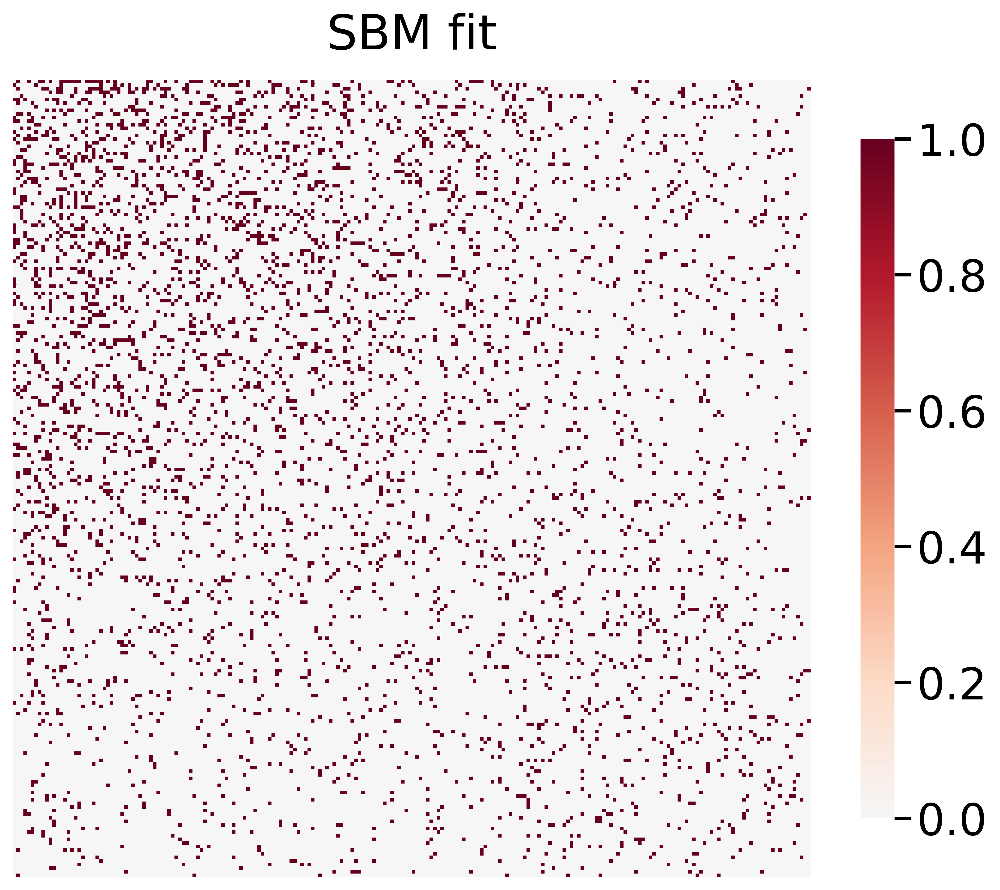

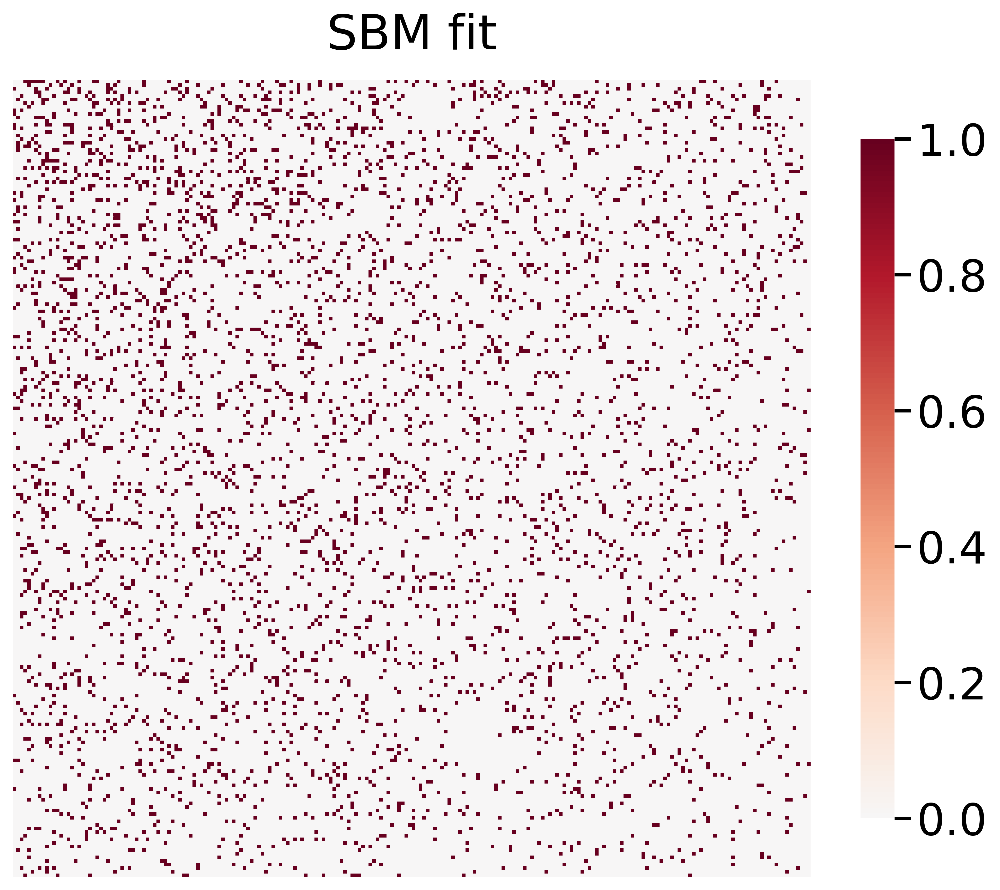

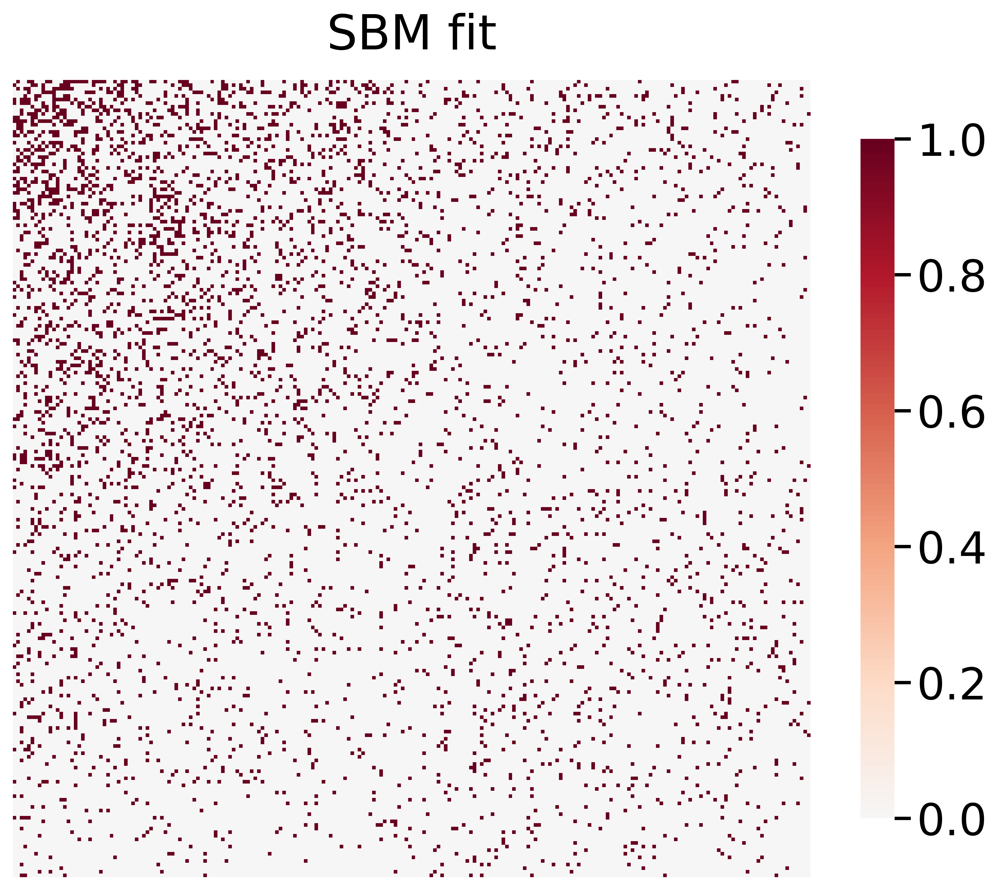

In [60]:
from graspologic.plot import heatmap
for row in rows:
    est = row['estimator']
    _ = heatmap(est.sample()[0],
        title="SBM fit",
        font_scale=1.5,
        sort_nodes=True)


In [63]:
results = pd.DataFrame(rows)
results.set_index(results['group_keys'], inplace=True)
results.drop(['group_keys'], axis=1, inplace=True)
results.head()

,bic,liklihood,n_params,estimator
group_keys,,,,
['Side'],-29798.610067,-14245.581070,121,SBMEstimator()
['Annotation'],-29743.418031,-14785.266177,16,SBMEstimator()
"['Side', 'Annotation']",-32781.615070,-13532.791200,529,SBMEstimator()


In [6]:
# load some ww data
ww_syn_list, edge_atts, node_atts, graph_atts = GraphIO.load('../c_elegans/worm_wiring/graphs/syn_list/Hermaphrodite/0.json')
wwsyn_graphs = GraphIO.multigraph_to_graphs(ww_syn_list)

In [5]:
ww_syn_list, layout = gr.layouts.layout_tsne(ww_syn_list.to_undirected(), perplexity=20, n_iter=1000000)

ValueError: This function does not work on multigraphs - because there are two reasonable ways to treat a multigraph with different behaviors, we insist that the caller create an appropriate Graph or DiGraph that represents the manner in which they'd like the multigraph to be treated for the purposes of this embedding